In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

from desc import set_device
set_device("gpu")

import numpy as np
import jax.numpy as jnp
from jax import vmap
from desc.backend import print_backend_info
from desc.coils import (
    CoilSet,
    initialize_modular_coils,
    initialize_saddle_coils,
    FourierRZSurfaceCoil
)
from desc.equilibrium import Equilibrium
from desc.plotting import plot_2d, plot_3d, plot_coils, plot_comparison, plot_boundary
from desc.grid import LinearGrid
from desc.objectives import (
    ObjectiveFunction,
    CoilCurvature,
    CoilLength,
    CoilSetMinDistance,
    QuadraticFlux,
    FixCoilCurrent,
    FixParameters,
    FixPressure,
    FixCurrent,
    FixBoundaryR,
    FixBoundaryZ,
    FixPsi,
    UmbilicHighCurvature,
    ForceBalance,
    AspectRatio,
    Elongation,
    Shear,
    RotationalTransform,
    SurfaceCurveConsistency
)
from desc.geometry import FourierRZSurfaceCurve, FourierRZToroidalSurface
from desc.optimize import Optimizer
import plotly.io as pio
import plotly.graph_objects as go

from desc.magnetic_fields import (
    solve_regularized_surface_current,
    FourierCurrentPotentialField,
)
from scipy.constants import mu_0
from desc.utils import rpz2xyz
import matplotlib.pyplot as plt


pio.renderers.default = "plotly_mimetype+notebook"


print_backend_info()

DESC version=0.17.2+49.g7b3f5885d.
Using JAX backend: jax version=0.9.2, jaxlib version=0.9.2, dtype=float64.
Using device: NVIDIA GeForce RTX 5070 Laptop GPU (id=0), with 1.77 GB available memory.


In [ ]:
                                                            ## Optimization 1
                                            ## Compare with REGCOIL + coil cutting on precise QA

In [ ]:
eq = desc.examples.get("precise_QA")

surf = eq.surface.constant_offset_surface(
    offset=0.3, 
    M=2,  
    N=eq.N,  
    grid=LinearGrid(M=8, N=2 * eq.N, NFP=eq.NFP),
)

In [3]:
                            # REGCOIL + coil cutting code copied from DESC stage 2 filamentary coil optimization notebook

surface_current_field = FourierCurrentPotentialField.from_surface(
    surf,
    I=0,
    G=np.asarray(
        [
            -eq.compute("G", grid=LinearGrid(rho=np.array(1.0)))["G"][0]
            / mu_0
            * 2
            * np.pi
        ]
    ),
    # set symmetry of the current potential, "sin" is usually expected for stellarator-symmetric surfaces and equilibria
    sym_Phi="sin",
)

surface_current_field.change_Phi_resolution(M=12, N=12)


# REGCOIL solve
fields, data = solve_regularized_surface_current(
    surface_current_field,  
    eq=eq,  
    current_helicity=(
        1,
        0,
    ),  
    eval_grid=LinearGrid(N=20, M=20, NFP=eq.NFP, sym=True),
    source_grid=LinearGrid(N=20, M=20, NFP=eq.NFP),
    lambda_regularization=1e-19,
    vacuum=True,  
    chunk_size=20, 
)

surface_current_field = fields[0]

coilset_initial_from_regcoil = surface_current_field.to_CoilSet(
    num_coils=3, stell_sym=True
)

##########################################################
Calculating Phi_SV for lambda_regularization = 1.00000e-19
##########################################################
chi^2 B = 4.21598e-08
min Bnormal = 2.75630e-11 (T)
Max Bnormal = 3.96759e-06 (T)
Avg Bnormal = 4.03837e-07 (T)
min Bnormal = 2.71113e-11 (unitless)
Max Bnormal = 3.90257e-06 (unitless)
Avg Bnormal = 3.97219e-07 (unitless)


In [4]:
                                            # Optimizing coils directly on the winding surface

# Set up initial coilset 
nc=3 
N_zeta = 5
G=eq.compute("G", grid=LinearGrid(rho=1.0))["G"]
current=2 * np.pi * G / (mu_0 * eq.NFP * nc * (eq.sym + 1))
spacing=2*np.pi/(nc*eq.NFP*(1+int(eq.sym)))
coils=[]
for i in range(nc):
    zeta = 0.5*spacing + i*spacing
    modes_zeta = [j for j in range(-N_zeta, N_zeta+1)]
    zeta_n=[0]*len(modes_zeta)
    zeta_n[N_zeta]=zeta
    coil = FourierRZSurfaceCoil(
        current=current,
        surface=surf,
        secular_theta=1,
        secular_zeta=0,
        theta_n=None,
        modes_theta=None,
        zeta_n=zeta_n,
        modes_zeta=modes_zeta
    )
    coils.append(coil)
init_coilset = CoilSet(coils, NFP=eq.NFP, sym=eq.sym)

In [7]:
# Optimize coilset 

coil_grid = LinearGrid(N=50)
plasma_grid = LinearGrid(M=25, N=25, NFP=eq.NFP, sym=eq.sym)
weights_dict = {
    "quadratic flux": 200,
    "coil-coil min dist": 100,
    "coil curvature": 750,
    "coil length": 20,
}


optimizer = Optimizer("lsq-exact")
obj = ObjectiveFunction(
        (
            QuadraticFlux(
                eq,
                field=init_coilset,
                eval_grid=plasma_grid,
                field_grid=coil_grid,
                vacuum=True,  
                weight=weights_dict["quadratic flux"],
                bs_chunk_size=10,
            ),
            CoilSetMinDistance(
                init_coilset,
                bounds=(0.1, np.inf),
                normalize_target=False,  
                grid=coil_grid,
                weight=weights_dict["coil-coil min dist"],
                dist_chunk_size=2,  
            ),
            CoilCurvature(
                init_coilset,
                bounds=(-1, 2),
                normalize_target=False, 
                grid=coil_grid,
                weight=weights_dict["coil curvature"],
            ),
            CoilLength(
                init_coilset,
                bounds=(0, 2 * np.pi * (init_coilset[0].compute("length")["length"])),
                normalize_target=True,  
                grid=coil_grid,
                weight=weights_dict["coil length"],
            ),
        )
)
coil_indices_to_fix_current = [False for c in init_coilset]
coil_indices_to_fix_current[0] = True
constraints = (FixCoilCurrent(init_coilset, indices=coil_indices_to_fix_current),
              FixParameters(init_coilset, {"R_lmn":True, "Z_lmn":True, "rotmat": True, "shift":True}))

In [8]:
(optimized_coilset,), _ = optimizer.optimize(
    init_coilset,
    objective=obj,
    constraints=constraints,
    maxiter=100,
    verbose=3,
    ftol=1e-4,
    copy=True,
)

Building objective: Quadratic flux
Precomputing transforms
Timer: Precomputing transforms = 1.95 sec
Building objective: coil-coil minimum distance
Building objective: coil curvature
Precomputing transforms
Timer: Precomputing transforms = 134 ms
Building objective: coil length
Precomputing transforms
Timer: Precomputing transforms = 2.77 ms
Timer: Objective build = 3.81 sec
Building objective: fixed coil current
Building objective: fixed parameters
Building objective: fixed shift
Building objective: fixed rotation
Timer: Objective build = 481 ms
Timer: LinearConstraintProjection build = 1.99 sec
Number of parameters: 35
Number of objectives: 1644
Timer: Initializing the optimization = 6.37 sec

Starting optimization
Using method: lsq-exact


E0812 14:11:44.788820   58885 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0812 14:11:44.883739   58870 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


Solver options:
------------------------------------------------------------
Maximum Function Evaluations       : 501
Maximum Allowed Total Δx Norm      : inf
Scaled Termination                 : True
Trust Region Method                : qr
Initial Trust Radius               : 1.642e+03
Maximum Trust Radius               : inf
Minimum Trust Radius               : 2.220e-16
Trust Radius Increase Ratio        : 2.000e+00
Trust Radius Decrease Ratio        : 2.500e-01
Trust Radius Increase Threshold    : 7.500e-01
Trust Radius Decrease Threshold    : 2.500e-01
------------------------------------------------------------ 

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          9.600e+06                                    2.860e+03   
       1              2          3.487e+06      6.112e+06      4.666e-01      1.048e+03   
       2              3          1.006e+06      2.481e+06      4.857e-01      1.705e+02   
       3 

In [ ]:
# Plot the two coilsets and the winding surface

fig = plot_3d(
    surf,
    "1",
)
fig = plot_coils(coilset_initial_from_regcoil, fig=fig)
fig = plot_coils(optimized_coilset, fig=fig)
fig.show()

In [ ]:
                                                        ## Optimization 2
                                            ## Umbilic curve optimization of US131

In [ ]:
# These parameters are taken from Rahul's umbilic stellarator paper. 
# Only testing a NFP=1 config here. would be worthwhile to test other configs.

n_umbilic=3
m_umbilic=1  # a subtlety here is that when converting to DESC's theta, this will end up becoming negative. So really, n_umbilic=3, m_umbilic=-1
NFP=1
R0=1
r1=0.133
r2=0
r3=0
r4=0.01
r5=0.1
r6=0
r7=0
hat_rho=0.1

# given parameters (theta,zeta) returns R, Z, and the DESC theta angle measured relative to the magnetic axis
def umbilic_parameterization(p):
    theta,zeta=p
    R = R0 + 2*hat_rho*jnp.cos(jnp.pi/(2*n_umbilic))*jnp.cos( 0.5*(theta + jnp.pi/n_umbilic*(2*jnp.floor(theta*n_umbilic/(2*jnp.pi))+1)) \
                                                           + 1/n_umbilic*(m_umbilic*NFP*zeta+r1*jnp.sin(NFP*zeta)+r4*jnp.sin(2*NFP*zeta))\
                                                         ) - hat_rho*jnp.cos(jnp.pi/n_umbilic*(2*jnp.floor(theta*n_umbilic/(2*jnp.pi))+1)\
                                                            + 1/n_umbilic*(m_umbilic*NFP*zeta+r1*jnp.sin(NFP*zeta)+r4*jnp.sin(2*NFP*zeta)))+ \
                                                    r2*jnp.cos(NFP*zeta)
    Z = 2*hat_rho*jnp.cos(jnp.pi/(2*n_umbilic))*jnp.sin( 0.5*(theta + jnp.pi/n_umbilic*(2*jnp.floor(theta*n_umbilic/(2*jnp.pi))+1)) \
                                                           + 1/n_umbilic*(m_umbilic*NFP*zeta+r5*jnp.sin(NFP*zeta)))\
                                                        - hat_rho*jnp.sin(jnp.pi/n_umbilic*(2*jnp.floor(theta*n_umbilic/(2*jnp.pi))+1)\
                                                            + 1/n_umbilic*(m_umbilic*NFP*zeta+r5*jnp.sin(NFP*zeta)))+ \
                                                    r3*jnp.sin(NFP*zeta)

    R_axis = 1 + r2*jnp.cos(zeta) + r7*jnp.cos(2*zeta)
    Z_axis = r3*jnp.sin(2*zeta) + r6*jnp.sin(zeta)

    theta_arctan = jnp.mod(jnp.arctan2(Z-Z_axis, R-R_axis), 2*jnp.pi)
    
    return R,Z, -theta_arctan



In [11]:
# Sample boundary and fit to FourierRZToroidalSurface

N_theta=50
N_zeta=70
angles = jnp.meshgrid(jnp.linspace(0,2*jnp.pi,N_theta,endpoint=False), jnp.linspace(0,2*jnp.pi,N_zeta,endpoint=False))
theta0 = angles[0].reshape(-1,1)
zeta0 = angles[1].reshape(-1,1)
angles=jnp.concatenate([theta0,zeta0],axis=1)

surf_map = vmap(umbilic_parameterization)
R_comp,Z_comp, theta_arctan_comp=surf_map(angles)
R=R_comp
Z=Z_comp
theta_arctan = theta_arctan_comp
phi=zeta0
rpz_coords=jnp.vstack([R.T,phi.T,Z.T]).T
xyz_coords=rpz2xyz(rpz_coords)

M_surf=15
N_surf=15
umbilic_surf = FourierRZToroidalSurface.from_values(rpz_coords,theta=np.squeeze(theta_arctan),M=M_surf,N=N_surf)

# Initialize a vacuum equilibrium
eq_init = Equilibrium(surface = umbilic_surf, L=8, M=M_surf, N=N_surf, Psi = np.pi*hat_rho**2, NFP=NFP)

(<Figure size 576.284x576.284 with 1 Axes>,
 <Axes: xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>)

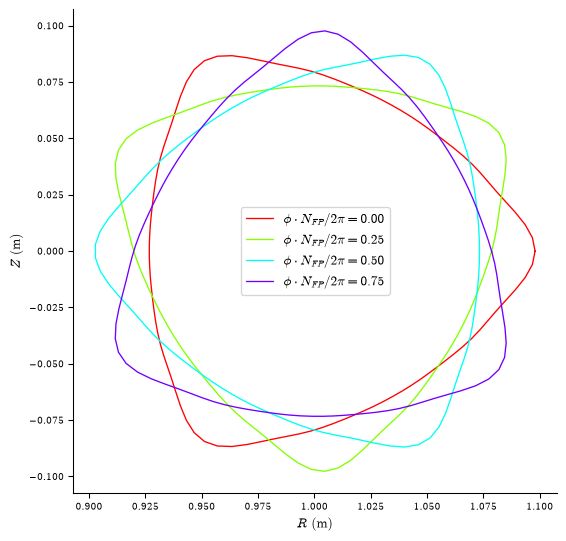

In [12]:
# View sections of umbilic surface
plot_boundary(eq_init.surface)

In [13]:
# View the k2 curvature on the surface

plot_3d(eq_init.surface, "curvature_k2_rho")

In [14]:
# Solve the equilibrium

objective=ObjectiveFunction(ForceBalance(eq=eq_init))
constraints= ( FixPressure(eq=eq_init), FixCurrent(eq=eq_init), FixPsi(eq=eq_init), FixBoundaryR(eq=eq_init), FixBoundaryZ(eq=eq_init))
eq, _ = eq_init.solve(objective=objective, constraints=constraints, ftol=1e-3, xtol=1e-5, gtol=1e-5, maxiter=70, verbose=3,copy=True)

eq.save("eq_US131_init.h5")

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 930 ms
Timer: Objective build = 1.21 sec
Building objective: fixed pressure
Building objective: fixed current
Building objective: fixed Psi
Building objective: lcfs R
Building objective: lcfs Z
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 562 ms
Timer: LinearConstraintProjection build = 5.64 sec
Number of parameters: 4384
Number of objectives: 18544
Timer: Initializing the optimization = 8.33 sec

Starting optimization
Using method: lsq-exact
Solver options:
------------------------------------------------------------
Maximum Function Evaluations       : 351
Maximum Allowed Total Δx Norm      : inf
Scaled Termination                 : True
Trust Region Method                : qr
Initial Trust Radius               : 1.866e+02
Max

E0812 14:13:47.847630   58883 xtile_compiler.cc:399] Fusion: input_reduce_fusion.37 = f64[14832]{0} fusion(get-tuple-element.492.0, geqrf.1.0), kind=kCustom, calls=fused_reduce.37.clone, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"fusion_backend_config":{"kind":"__triton","block_level_fusion_config":{"num_warps":"8","output_tiles":[{"sizes":["128"]}],"num_ctas":1,"num_stages":1,"is_tma_allowed":true,"is_warp_specialization_allowed":false}},"force_earliest_schedule":false,"reification_cost":[],"device_type":"DEVICE_TYPE_INVALID"}
E0812 14:13:47.847662   58883 xtile_compiler.cc:401] Computation: fused_reduce.37.clone {
  iota.160.7 = s64[14832]{0} iota(), iota_dimension=0
  constant_0_96 = s64[] constant(-1)
  broadcast.511.7 = s64[14832]{0} broadcast(constant_0_96), dimensions={}
  add.208.7 = s64[14832]{0} add(iota.160.7, broadcast.511.7)
  broadcast.931.5 = s64[128,14832]{1,0} broadcast(add.208.7), dimensions={1}
  iota.549.5 = s64[128,14832]{1,0} iota(), i

       1              3          3.273e-01      6.871e-01      1.110e+00      2.029e-01   
       2              4          1.704e-01      1.569e-01      2.260e+00      4.793e-01   
       3              5          1.550e-02      1.549e-01      1.301e+00      7.324e-02   
       4              6          1.478e-03      1.403e-02      7.277e-01      1.567e-02   
       5              7          1.910e-04      1.287e-03      3.897e-01      5.002e-03   
       6              9          1.603e-05      1.750e-04      2.131e-01      1.406e-03   
       7             11          8.469e-07      1.519e-05      7.259e-02      1.463e-04   
       8             13          1.454e-07      7.015e-07      1.908e-02      5.767e-05   
       9             15          7.954e-08      6.585e-08      8.375e-03      1.602e-05   
      10             17          7.215e-08      7.393e-09      4.123e-03      3.817e-06   
`gtol` condition satisfied. (gtol=1.00e-05)
         Current function value: 7.215e-08
   

In [15]:
# Fit the initial surface curve. Necessary since the new theta is not the same as the one 
# used in the original surface parameterization 

Nmodes_theta=10
edge_res = 100
angles = jnp.meshgrid(jnp.array([0.0]), jnp.linspace(0,2*n_umbilic*jnp.pi,edge_res,endpoint=False))
theta0 = angles[0].reshape(-1,1)
zeta0 = angles[1].reshape(-1,1)
angles=jnp.concatenate([theta0,zeta0],axis=1)

surf_map = vmap(umbilic_parameterization)
_,_,theta_arctan_comp=surf_map(angles)
theta_curve = theta_arctan_comp
s_curve = zeta0/n_umbilic
surfacecurve_coords = jnp.array([jnp.squeeze(s_curve), jnp.squeeze(theta_curve), jnp.squeeze(zeta0)]).T

edge = FourierRZSurfaceCurve.from_values(surfacecurve_coords, equilibrium=eq,NFP=NFP, N_zeta=None)


In [ ]:
# Plot curve in lab coordinates (sorry for odd viewing angle)

def plot_curve(curve):
    curve_plot_res = 100
    curve_data = curve.compute("x", grid=LinearGrid(N=curve_plot_res))
    x_curve,y_curve,z_curve = rpz2xyz(curve_data["x"]).T
    x_curve=x_curve.tolist()
    y_curve=y_curve.tolist()
    z_curve=z_curve.tolist()
    x_curve.append(x_curve[0])
    y_curve.append(y_curve[0])
    z_curve.append(z_curve[0])
    
    fig = go.Figure(data=[go.Scatter3d(
        x=x_curve,
        y=y_curve,
        z=z_curve,
        mode='lines',
        marker=dict(
            size=6,
            opacity=1
        ),
        line=dict(width=8)
    )])
    return fig

def plot_curve_and_surface(curve, surface):
    fig = plot_curve(curve)
    fig2 = plot_3d(surface,"curvature_k2_rho")
    trace=fig2.data[0]
    fig.add_trace(trace)
    return fig

fig=plot_curve_and_surface(edge, eq.surface)
fig.show()

In [17]:
# A good first test: with the surface fixed and randomly initialized curve, recover the edge

optimizer = Optimizer("lsq-exact")

rng = np.random.default_rng(seed=42)
theta_n_init = 0.5*rng.random(edge.theta_basis.modes.shape[0]) # raising the 0.5 too much leaves the convergent basin

    
edge_coldstart = FourierRZSurfaceCurve(eq, secular_theta=edge.secular_theta, secular_zeta=edge.secular_zeta, modes_theta=edge.theta_basis.modes, 
                                       modes_zeta=None, theta_n=theta_n_init, zeta_n=None)

objective = ObjectiveFunction(
    UmbilicHighCurvature(edge_coldstart, bounds=(-np.inf,-60))
)

constraints = (FixParameters(edge_coldstart, {"R_lmn":True, "Z_lmn": True, "rotmat": True, "shift": True}),)

(edge_optimized,),_ = optimizer.optimize(edge_coldstart, objective=objective, constraints=constraints, maxiter=100, verbose=3, ftol=1e-4, copy=True)

Building objective: Umbilic high curvature
Precomputing transforms
Timer: Precomputing transforms = 214 ms
Timer: Objective build = 799 ms
Building objective: fixed parameters
Building objective: fixed shift
Building objective: fixed rotation
Timer: Objective build = 118 ms
Timer: LinearConstraintProjection build = 2.17 sec
Number of parameters: 21
Number of objectives: 145
Timer: Initializing the optimization = 3.19 sec

Starting optimization
Using method: lsq-exact


/home/singh/Documents/DESC/desc/utils.py:563: FutureWarning: constants is deprecated and will be removed in a future release. Users should not include constants in the arguments of their objective compute methods. Instead declare all the constants in the build method and use as self._constants.
  warnings.warn(msg, err)


Solver options:
------------------------------------------------------------
Maximum Function Evaluations       : 501
Maximum Allowed Total Δx Norm      : inf
Scaled Termination                 : True
Trust Region Method                : qr
Initial Trust Radius               : 3.675e+00
Maximum Trust Radius               : inf
Minimum Trust Radius               : 2.220e-16
Trust Radius Increase Ratio        : 2.000e+00
Trust Radius Decrease Ratio        : 2.500e-01
Trust Radius Increase Threshold    : 7.500e-01
Trust Radius Decrease Threshold    : 2.500e-01
------------------------------------------------------------ 

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          1.186e+03                                    4.605e+01   
       1              2          1.010e+03      1.759e+02      1.860e-02      4.169e+01   
       2              3          6.953e+02      3.149e+02      3.158e-02      3.338e+01   
       3 

In [18]:
# Plot before and after
fig=plot_curve_and_surface(edge_coldstart, eq.surface)
fig.show()

In [19]:
fig=plot_curve_and_surface(edge_optimized, eq.surface)
fig.show()

In [22]:
# Now we jointly optimize the equilibrium and the curve, with the goal of 
# making the second principal curvature on the edge more negative, and 
# pushing iota to the value one would expect if the edge were an exact 
# fieldline, i.e. secular_zeta/secular_theta = -1/3.

MN = 8            # equilibrium resolution for the joint step (15 is too slow)
K = 8             # max unfixed mode number
k2_bound = -35.0  # upper bound for k2 along edge

eq_joint = eq.copy()
eq_joint.change_resolution(L=eq.L, M=MN, N=MN,
                           L_grid=2 * eq.L, M_grid=2 * MN, N_grid=2 * MN)


# Refit the curve to the lower resolution equilibrium
angles = jnp.meshgrid(jnp.array([0.0]),
                      jnp.linspace(0, 2 * n_umbilic * jnp.pi, edge_res, endpoint=False))
theta0 = angles[0].reshape(-1, 1)
zeta0 = angles[1].reshape(-1, 1)
_, _, theta_curve = vmap(umbilic_parameterization)(jnp.concatenate([theta0, zeta0], axis=1))
edge_joint = FourierRZSurfaceCurve.from_values(jnp.array([jnp.squeeze(zeta0/n_umbilic),jnp.squeeze(theta_curve),jnp.squeeze(zeta0)]).T,
    equilibrium=eq_joint, NFP=NFP, N_zeta=None)


## Preparing objectives
iota_target = -NFP * m_umbilic / n_umbilic        
iota_bounds = (1.2 * iota_target, 0.8 * iota_target) # iota_target is negative

iota_grid = LinearGrid(M=eq_joint.M, N=eq_joint.N,
                       rho=np.array([1.0]), NFP=eq_joint.NFP, sym=True)
elongation_grid = LinearGrid(M=2 * eq_joint.M, N=2 * eq_joint.N,
                             rho=np.array([1.0]), NFP=eq_joint.NFP, sym=False)

modes_R = np.vstack(([0, 0, 0],
                     eq_joint.surface.R_basis.modes[
                         np.max(np.abs(eq_joint.surface.R_basis.modes), 1) > K, :]))
modes_Z = eq_joint.surface.Z_basis.modes[
    np.max(np.abs(eq_joint.surface.Z_basis.modes), 1) > K, :]

objective = ObjectiveFunction(
    (
        ForceBalance(eq=eq_joint, weight=2e5),          
        AspectRatio(eq_joint, bounds=(9, 12), weight=50),
        UmbilicHighCurvature(edge_joint, bounds=(-np.inf, k2_bound), weight=1e3),
        RotationalTransform(eq=eq_joint, grid=iota_grid, bounds=iota_bounds, weight=1e3),
        Elongation(eq=eq_joint, grid=elongation_grid, bounds=(0.5, 3.0), weight=2e2),
        Shear(eq=eq_joint, grid=iota_grid, bounds=(-np.inf, -0.05), weight=1e3),
    )
)

constraints = (
    ForceBalance(eq=eq_joint),
    FixPressure(eq=eq_joint),
    FixCurrent(eq=eq_joint),
    FixPsi(eq=eq_joint),
    FixBoundaryR(eq=eq_joint, modes=modes_R),
    FixBoundaryZ(eq=eq_joint, modes=modes_Z),
    SurfaceCurveConsistency(eq_joint, edge_joint),
)

optimizer = Optimizer("proximal-lsq-exact")
(eq_optimized, edge_optimized), _ = optimizer.optimize(
    [eq_joint, edge_joint],
    objective=objective,
    constraints=constraints,
    maxiter=150,
    verbose=3,
    ftol=1e-8, xtol=1e-8, gtol=1e-8,
    copy=True,
    options={"perturb_options": {"order": 2},
             "solve_options": {"ftol": 1e-8, "xtol": 1e-10, "maxiter": 40}},
)


Building objective: Umbilic high curvature
Precomputing transforms
Building objective: fixed parameters
Building objective: fixed shift
Building objective: fixed rotation
Number of parameters: 21
Number of objectives: 89

Starting optimization
Using method: lsq-exact


/home/singh/Documents/DESC/desc/utils.py:563: FutureWarning: constants is deprecated and will be removed in a future release. Users should not include constants in the arguments of their objective compute methods. Instead declare all the constants in the build method and use as self._constants.
  warnings.warn(msg, err)


`gtol` condition satisfied. (gtol=1.00e-08)
         Current function value: 0.000e+00
         Total delta_x: 0.000e+00
         Iterations: 0
         Function evaluations: 1
         Jacobian evaluations: 1
                                                                 Start  -->   End
Total (sum of squares):                                      0.000e+00  -->   0.000e+00, 
Maximum Umbilic high curvature:                             -4.211e+01  -->  -4.211e+01 (m^-1)
Minimum Umbilic high curvature:                             -4.261e+01  -->  -4.261e+01 (m^-1)
Average Umbilic high curvature:                             -4.239e+01  -->  -4.239e+01 (m^-1)
Maximum Umbilic high curvature:                             -3.439e+00  -->  -3.439e+00 (normalized)
Minimum Umbilic high curvature:                             -3.480e+00  -->  -3.480e+00 (normalized)
Average Umbilic high curvature:                             -3.462e+00  -->  -3.462e+00 (normalized)
Fixed parameters error:       

/home/singh/Documents/DESC/desc/utils.py:563: FutureWarning: constants is deprecated and will be removed in a future release. Users should not include constants in the arguments of their objective compute methods. Instead declare all the constants in the build method and use as self._constants.
  warnings.warn(msg, err)


Solver options:
------------------------------------------------------------
Maximum Function Evaluations       : 751
Maximum Allowed Total Δx Norm      : inf
Scaled Termination                 : True
Trust Region Method                : qr
Initial Trust Radius               : 1.783e+02
Maximum Trust Radius               : inf
Minimum Trust Radius               : 2.220e-16
Trust Radius Increase Ratio        : 2.000e+00
Trust Radius Decrease Ratio        : 2.500e-01
Trust Radius Increase Threshold    : 7.500e-01
Trust Radius Decrease Threshold    : 2.500e-01
------------------------------------------------------------ 

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          3.252e+04                                    7.185e+01   


E0812 14:23:07.713880   58881 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


       1              3          2.537e+04      7.152e+03      6.304e-02      6.014e+01   
       2              4          1.447e+04      1.089e+04      8.186e-02      3.911e+01   
       3              6          1.119e+04      3.278e+03      3.812e-02      2.931e+01   
       4              8          1.008e+04      1.114e+03      2.203e-02      2.583e+01   
       5              9          8.237e+03      1.844e+03      4.346e-02      1.272e+01   
       6             12          8.162e+03      7.407e+01      5.741e-03      1.471e+01   
       7             13          7.935e+03      2.277e+02      5.523e-03      1.127e+01   
       8             14          7.817e+03      1.183e+02      1.155e-02      1.768e+01   
       9             15          7.435e+03      3.814e+02      1.050e-02      1.491e+01   
      10             17          7.331e+03      1.039e+02      5.079e-03      1.401e+01   
      11             18          7.190e+03      1.410e+02      5.112e-03      1.349e+01   

In [23]:
# compute final iota (at rho=1) and k2 (along edge)
grid_iota = LinearGrid(M=eq_optimized.M, N=eq_optimized.N,
                rho=np.array([1.0]), NFP=eq_optimized.NFP, sym=True)
obj_k2 = UmbilicHighCurvature(edge_optimized)
obj_k2.build(verbose=0)
k2 = np.asarray(obj_k2.compute_unscaled(edge_optimized.params_dict))

iota_final = eq_optimized.compute("iota", grid=grid_iota)["iota"][0]
print(f"final iota is {iota_final}")
print(f"min/max k2 along edge are {np.min(k2)}, {np.max(k2)}")

# verify edge remains on rho=1 surface
dR = np.abs(np.asarray(edge_optimized.R_lmn)
                  - np.asarray(eq_optimized.surface.R_lmn)).max()
dZ = np.abs(np.asarray(edge_optimized.Z_lmn)
                  - np.asarray(eq_optimized.surface.Z_lmn)).max()
print(f"max deviation in R,Z fourier modes is {max(dR,dZ)}")


/home/singh/Documents/DESC/desc/utils.py:563: FutureWarning: constants is deprecated and will be removed in a future release. Users should not include constants in the arguments of their objective compute methods. Instead declare all the constants in the build method and use as self._constants.
  warnings.warn(msg, err)


final iota is -0.26609083637361863
min/max k2 along edge are -123.85276626217484, -35.00001346424558
max deviation in R,Z fourier modes is 7.771561172376096e-16


(<Figure size 1152.57x960.473 with 6 Axes>,
 array([<Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.000$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>,
        <Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.167$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>,
        <Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.333$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>,
        <Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.500$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>,
        <Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.667$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>,
        <Axes: title={'center': '$\\phi \\cdot N_{FP}/2\\pi = 0.833$'}, xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>],
       dtype=object))

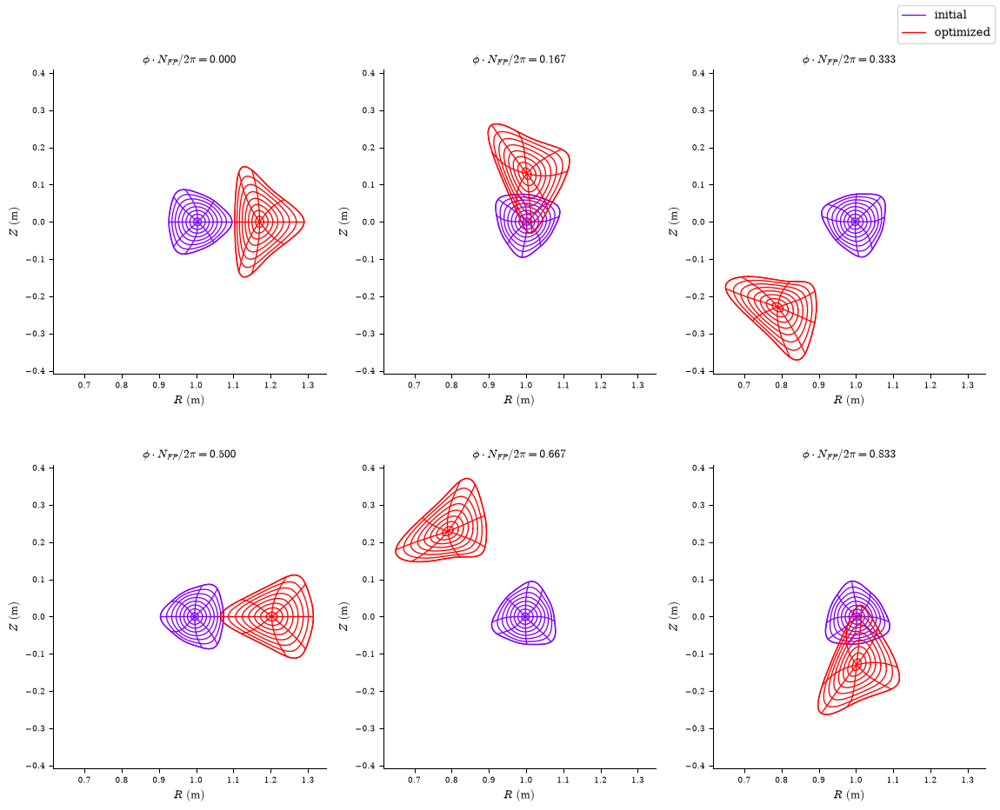

In [24]:
# plot the initial and final equilibrium surfaces
plot_comparison([eq_joint, eq_optimized], labels=["initial", "optimized"])

In [26]:
plot_3d(eq_optimized,"curvature_k2_rho")